In [1]:
import pystac
import stackstac
import geopandas as gpd
import hvplot.xarray
from dask.distributed import Client
import rioxarray
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from datetime import datetime
import copy
import matplotlib
import matplotlib.dates as mdates
import numpy.ma as ma
import rasterio
from rasterio import plot
import xarray as xr
import rioxarray as rxr
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy

In [2]:
# MODIFY PARAMETERS

#-------------------------------------------------------------------------
# comment ONE of these out at a time
relative_orbit_number = 137 # change to get any particular relative orbit
#orbit_direction = 'ascending' # 'ascending', descending', 'all'
#-------------------------------------------------------------------------
# define time slice
today = datetime.today().strftime('%Y-%m-%d')
time_slice = slice('2020-01-01','2020-12-31') # All of 2020
#time_slice = slice('2017-01-01',today)
#-------------------------------------------------------------------------
# what months are represented with colors
time_slice_display = slice('2020-02-01','2020-7-31')
#-------------------------------------------------------------------------
polarization ='gamma0_vv'
#-------------------------------------------------------------------------
bounding_box_gf = gpd.read_file('shapefiles/mt_rainier.geojson')
#-------------------------------------------------------------------------
rainier_glaciers = gpd.read_file('shapefiles/rainier_glaciers.geojson')
#-------------------------------------------------------------------------
shapefile_clip = True

In [3]:
if 'relative_orbit_number' in locals():
    by_orbit = True
else: 
    by_orbit = False
if shapefile_clip == True:
    shapefile_clip_status = 'clipped'
else:
    shapefile_clip_status = ''

In [4]:
# GDAL environment variables for better performance
os.environ['AWS_REGION']='us-west-2'
os.environ['GDAL_DISABLE_READDIR_ON_OPEN']='EMPTY_DIR' 
os.environ['AWS_NO_SIGN_REQUEST']='YES' 

In [5]:
# Paste /proxy/localhost:8787 for cluster diagnostics
client = Client(local_directory='/tmp', processes=False)

/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 41895 instead
  warnings.warn(


In [6]:
# Load STAC ItemCollection
stac_items = pystac.ItemCollection.from_file('mycollection.json')
items = [item.to_dict(transform_hrefs=False) for item in stac_items]

stack = stackstac.stack(items,
                        dtype='float32')

In [7]:
# import bounding box
bounding_box_utm_gf = bounding_box_gf.to_crs(stack.crs)
xmin, ymax, xmax, ymin = bounding_box_utm_gf.bounds.values[0]
rainier_glaciers = rainier_glaciers.to_crs(stack.crs)

In [8]:
# filter scenes
scenes = stack.sel(band=polarization).sel(x=slice(xmin,xmax),y=slice(ymin,ymax)).sel(time=time_slice)

In [9]:
# filter by orbit direction or orbit number
if by_orbit:
    scenes = scenes.where(scenes.coords['sat:relative_orbit']==relative_orbit_number,drop=True)
    orbit_directions = scenes.coords['sat:orbit_state']
    orbit_direction = orbit_directions[0].values
elif orbit_direction == 'all':
    scenes = scenes
else:
    scenes = scenes.where(scenes.coords['sat:orbit_state']==orbit_direction,drop=True)

In [10]:
%%time
# compute frames, drop missing data
frames_all = scenes.compute()
frames = frames_all.dropna('time',how='all')

CPU times: user 2.52 s, sys: 426 ms, total: 2.94 s
Wall time: 2.46 s


In [11]:
# calculate backscatter minima to predict snow melt timing
mins_info_runoff = frames.argmin(dim='time',skipna=False)
mins_info_ripening = frames.differentiate(coord='time',datetime_unit='W').argmin(dim='time',skipna=False) # dt=week
runoff_dates = frames[mins_info_runoff].time
ripening_dates = frames[mins_info_ripening].time
runoff_dates = runoff_dates.rio.write_crs(stack.crs)
ripening_dates = ripening_dates.rio.write_crs(stack.crs)

In [12]:
# form data cube for clipping
data_cube = xr.concat([frames[mins_info_runoff], frames[mins_info_ripening]], "z")

In [13]:
# read in and project DEM, aspect, slope, and diurnal anisotropic heat index
dem = rxr.open_rasterio('dem/dem_rainier_py3dep.tif',masked=True)
dem_projected = dem.rio.reproject_match(data_cube)
aspect = rxr.open_rasterio('dem/aspect_rainier_py3dep.tif',masked=True)
aspect_projected = aspect.rio.reproject_match(data_cube)
slope = rxr.open_rasterio('dem/slope_rainier_py3dep.tif',masked=True)
slope_projected = slope.rio.reproject_match(data_cube)
dah = rxr.open_rasterio('dem/diurnal_anisotropic_heating_index_rainier.tif',masked=True)
dah_projected = dah.rio.reproject_match(data_cube)

dem_projected = dem_projected.assign_coords({
    "x": data_cube.x,
    "y": data_cube.y,
    "band": dem_projected.band,
})
aspect_projected = aspect_projected.assign_coords({
    "x": data_cube.x,
    "y": data_cube.y,
    "band": aspect_projected.band,
})
slope_projected = slope_projected.assign_coords({
    "x": data_cube.x,
    "y": data_cube.y,
    "band": slope_projected.band,
})
dah_projected = dah_projected.assign_coords({
    "x": data_cube.x,
    "y": data_cube.y,
    "band": dah_projected.band,
})

In [14]:
# CHECK IF CLIP CHANGES STATS
if shapefile_clip:
    dem_projected = dem_projected.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False) 
    aspect_projected = aspect_projected.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)
    slope_projected = slope_projected.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)
    dah_projected = dah_projected.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)
    runoff_dates = runoff_dates.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False)
    ripening_dates = ripening_dates.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs,drop=False,invert=False) 

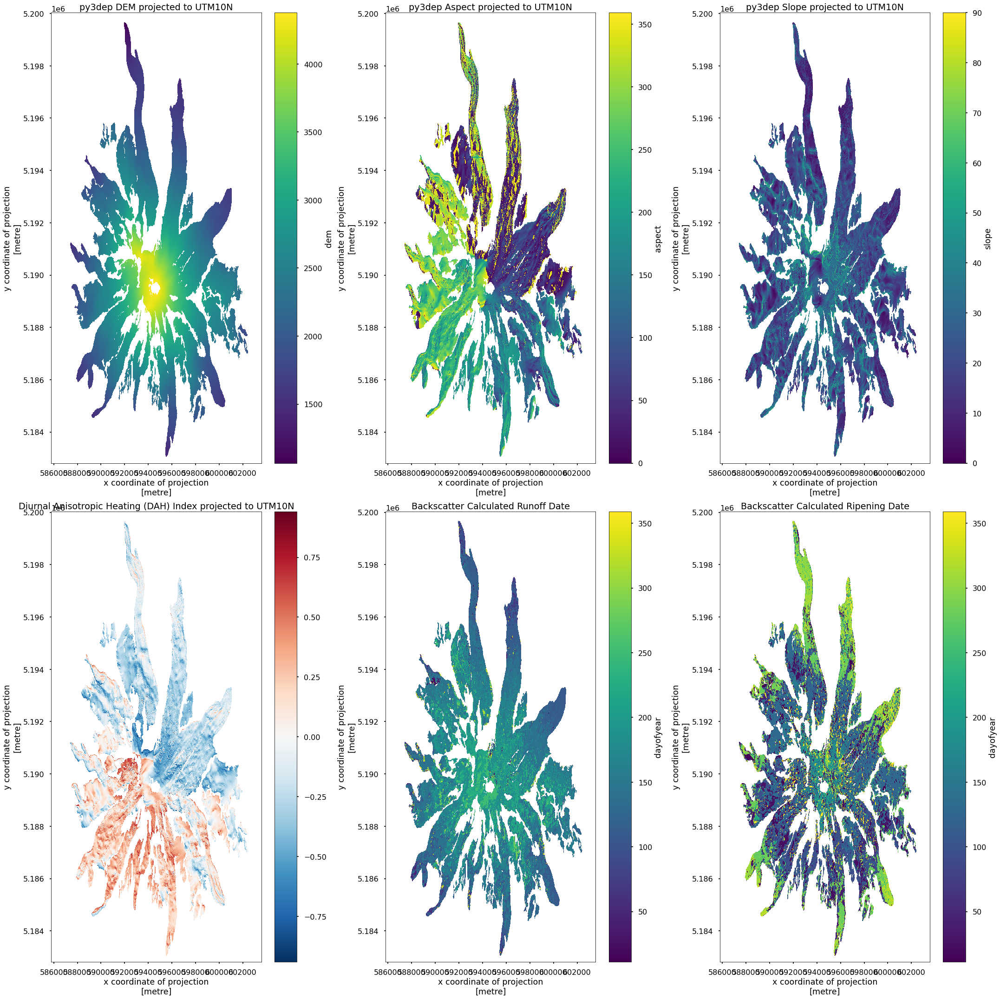

In [15]:
plt.style.use('seaborn-poster')
f,ax=plt.subplots(2,3,figsize=(30,30))
dem_projected.plot(ax=ax[0,0])
ax[0,0].set_title('py3dep DEM projected to UTM10N')
aspect_projected.plot(ax=ax[0,1],vmin=0,vmax=359)
ax[0,1].set_title('py3dep Aspect projected to UTM10N')
slope_projected.plot(ax=ax[0,2],vmin=0,vmax=90)
ax[0,2].set_title('py3dep Slope projected to UTM10N')
dah_projected.plot(ax=ax[1,0])
ax[1,0].set_title('Diurnal Anisotropic Heating (DAH) Index projected to UTM10N')
runoff_dates.dt.dayofyear.plot(ax=ax[1,1])
ax[1,1].set_title('Backscatter Calculated Runoff Date')
ripening_dates.dt.dayofyear.plot(ax=ax[1,2])
ax[1,2].set_title('Backscatter Calculated Ripening Date')
plt.tight_layout()

In [16]:
dates_df = pd.DataFrame(columns=['x','y','elevation', 'aspect','aspect_rescale','dah','runoff_dates','ripening_dates'])
a1, a2 = np.meshgrid(dem_projected.indexes['x'],dem_projected.indexes['y'])
dates_df['x'] = a1.reshape(-1)
dates_df['y'] = a2.reshape(-1)
dates_df['elevation'] = dem_projected.data.reshape(-1)
dates_df['aspect'] = aspect_projected.data.reshape(-1)
dates_df['aspect_rescale'] = np.abs(aspect_projected.data.reshape(-1)-180)
dates_df['dah'] = dah_projected.data.reshape(-1)
dates_df['runoff_dates'] = runoff_dates.dt.dayofyear.data.reshape(-1)
dates_df['ripening_dates'] = ripening_dates.dt.dayofyear.data.reshape(-1)

In [17]:
dates_df = dates_df.dropna()

## Two Way ANOVA Analysis

In [50]:
# bin our elevation and aspect data
#dates_df['elevation_bins'] = pd.cut(dates_df['elevation'], bins=np.linspace(1000, 4500, 8))
#dates_df['aspect_bins'] = pd.cut(dates_df['aspect_rescale'], bins=np.linspace(0, 180, 10))
dates_df['elevation_bins'] = pd.cut(dates_df['elevation'], bins=np.linspace(dates_df['elevation'].min(), dates_df['elevation'].max(), 5))
dates_df['dah_bins'] = pd.cut(dates_df['dah'], bins=np.linspace(dates_df['dah'].min(), dates_df['dah'].max(), 5))

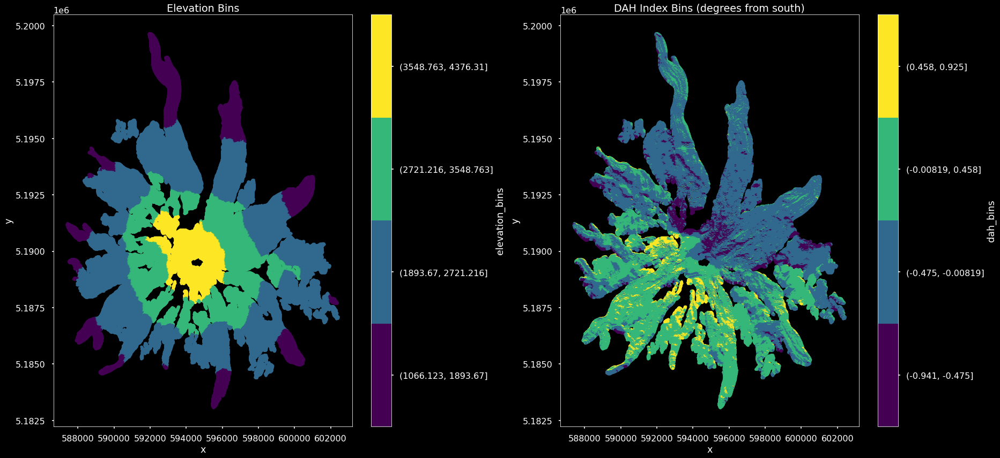

In [51]:
f,ax=plt.subplots(1,2,figsize=(26,12))
dates_df.plot.scatter(x='x',y='y',c='elevation_bins',cmap='viridis',ax=ax[0])
#dates_df.plot.scatter(x='x',y='y',c='aspect_bins',cmap='viridis',ax=ax[1])
dates_df.plot.scatter(x='x',y='y',c='dah_bins',cmap='viridis',ax=ax[1])
ax[0].set_title('Elevation Bins')
ax[1].set_title('DAH Index Bins (degrees from south)')
plt.tight_layout()

In [52]:
# to avoid spatial autocorrelation we must sample
# https://www.statisticshowto.com/morans-i/
# https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2018WR022553
# https://geographicdata.science/book/notebooks/07_local_autocorrelation.html

#dates_sample_df = dates_df.sample(frac=0.05)
dates_sample_df = dates_df.iloc[::500]
#dates_sample_df = dates_df.sample(n=30)

In [56]:
from pysal.explore import esda   # Exploratory Spatial analytics
from pysal.lib import weights


# Generate W from the GeoDataFrame
w = weights.distance.KNN.from_dataframe(db, k=8)
# Row-standardization
w.transform = 'R'

lisa = esda.moran.Moran_Local(dates_sample_df['runoff_dates'], w)

ax = seaborn.kdeplot(lisa.Is)
seaborn.rugplot(lisa.Is, ax=ax)

ModuleNotFoundError: No module named 'pysal'

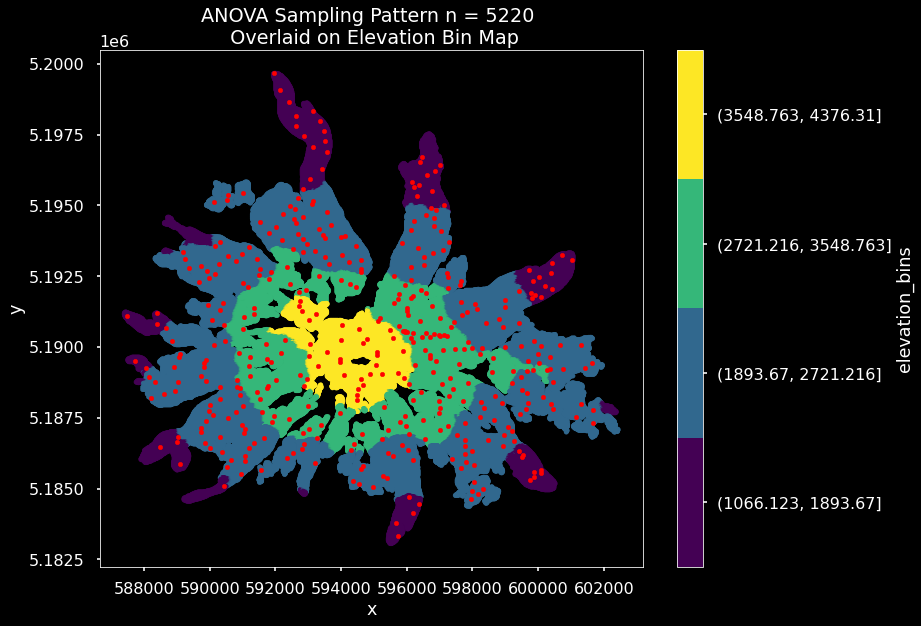

In [53]:
f,ax=plt.subplots()
dates_df.plot.scatter(x='x',y='y',c='elevation_bins',cmap='viridis',ax=ax)
dates_sample_df.plot.scatter(x='x',y='y',c='r',ax=ax)
ax.set_title(f'ANOVA Sampling Pattern n = {dates_sample_df.size} \n Overlaid on Elevation Bin Map')
plt.tight_layout()

In [54]:
# perform two-way ANOVA https://www.reneshbedre.com/blog/anova.html
#model = ols('runoff_dates ~ C(elevation_bins) + C(aspect_bins) + C(elevation_bins):C(aspect_bins)', data=dates_sample_df).fit()
model = ols('runoff_dates ~ C(elevation_bins) + C(dah_bins) + C(elevation_bins):C(dah_bins)', data=dates_sample_df).fit()
sm.stats.anova_lm(model, typ=2)

/mnt/working/egagli/sw/miniconda3/envs/aws-rtc-stac2/lib/python3.8/site-packages/statsmodels/base/model.py:1871: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 2
  warnings.warn('covariance of constraints does not have full '


,sum_sq,df,F,PR(>F)
C(elevation_bins),427898.426786,3.0,110.223501,1.190147e-52
C(dah_bins),17117.289661,3.0,4.409288,1.273201e-02
C(elevation_bins):C(dah_bins),63625.771470,9.0,5.463178,4.131530e-07
Residual,543493.713274,420.0,NaN,NaN


In [55]:
#perform two-way ANOVA
model = ols('ripening_dates ~ C(elevation_bins) + C(dah_bins) + C(elevation_bins):C(dah_bins)', data=dates_sample_df).fit()
sm.stats.anova_lm(model, typ=2)

,sum_sq,df,F,PR(>F)
C(elevation_bins),3.565030e+05,3.0,14.065486,9.402219e-09
C(dah_bins),6.841874e+05,3.0,26.993961,5.541037e-16
C(elevation_bins):C(dah_bins),6.972583e+05,9.0,9.169887,1.019006e-12
Residual,3.548432e+06,420.0,NaN,NaN


# Multiple Linear Regression Analysis

In [24]:
dates_mls_df = dates_df.filter(['elevation','dah','runoff_dates','ripening_dates'])
dates_mls_df.corr()

,elevation,dah,runoff_dates,ripening_dates
elevation,1.000000,0.041349,0.571378,-0.179253
dah,0.041349,1.000000,-0.056111,-0.071245
runoff_dates,0.571378,-0.056111,1.000000,-0.181469
ripening_dates,-0.179253,-0.071245,-0.181469,1.000000


In [25]:
predictors = np.append(np.ones_like([dates_df['runoff_dates']]).T,dates_mls_df.iloc[:,[0,1]].to_numpy(),axis=1)
B,_,_,_ = scipy.linalg.lstsq(predictors, dates_mls_df.iloc[:,2])
dates_df['runoff_prediction'] = predictors.dot(B)

In [26]:
predictors = np.append(np.ones_like([dates_df['runoff_dates']]).T,dates_mls_df.iloc[:,[0,1]].to_numpy(),axis=1)
B,_,_,_ = scipy.linalg.lstsq(predictors, dates_mls_df.iloc[:,3])
dates_df['ripening_prediction'] = predictors.dot(B)

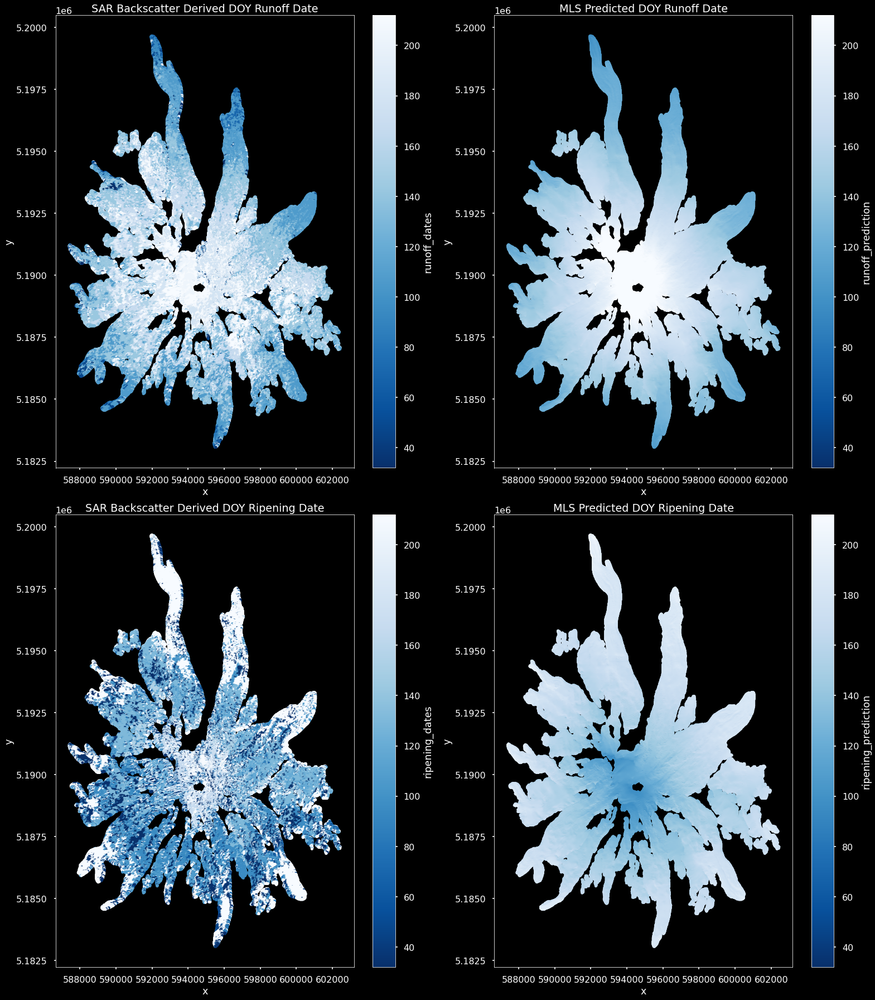

In [27]:
plt.style.use('dark_background')
f,ax=plt.subplots(2,2,figsize=(22,25))

dates_df.plot.scatter(x='x',y='y',c='runoff_prediction',cmap='Blues_r',ax=ax[0,1],vmin=32,vmax=212)
dates_df.plot.scatter(x='x',y='y',c='runoff_dates',cmap='Blues_r',ax=ax[0,0],vmin=32,vmax=212)
ax[0,0].set_title('SAR Backscatter Derived DOY Runoff Date')
ax[0,1].set_title('MLS Predicted DOY Runoff Date')
dates_df.plot.scatter(x='x',y='y',c='ripening_prediction',cmap='Blues_r',ax=ax[1,1],vmin=32,vmax=212)
dates_df.plot.scatter(x='x',y='y',c='ripening_dates',cmap='Blues_r',ax=ax[1,0],vmin=32,vmax=212)
ax[1,0].set_title('SAR Backscatter Derived DOY Ripening Date')
ax[1,1].set_title('MLS Predicted DOY Ripening Date')
plt.tight_layout()

In [28]:
# thinking... what if we applied this MLS model to another mountain in cascades, how would it predict

In [29]:
dates_df.corr()

,x,y,elevation,aspect,aspect_rescale,dah,runoff_dates,ripening_dates,runoff_prediction,ripening_prediction
x,1.000000,-0.114233,0.008388,-0.473670,-0.012259,-0.188956,-0.035923,0.044345,0.034515,0.055707
y,-0.114233,1.000000,-0.209755,-0.039370,0.631802,-0.494930,-0.078630,0.197690,-0.140419,0.360970
elevation,0.008388,-0.209755,1.000000,-0.046080,-0.118986,0.041349,0.571378,-0.179253,0.990387,-0.941960
aspect,-0.473670,-0.039370,-0.046080,1.000000,-0.112073,0.356853,-0.015658,-0.019222,-0.095306,-0.077141
aspect_rescale,-0.012259,0.631802,-0.118986,-0.112073,1.000000,-0.848797,0.020734,0.088114,-0.001011,0.395633
dah,-0.188956,-0.494930,0.041349,0.356853,-0.848797,1.000000,-0.056111,-0.071245,-0.097258,-0.374386
runoff_dates,-0.035923,-0.078630,0.571378,-0.015658,0.020734,-0.056111,1.000000,-0.181469,0.576925,-0.511423
ripening_dates,0.044345,0.197690,-0.179253,-0.019222,0.088114,-0.071245,-0.181469,1.000000,-0.168693,0.190298
runoff_prediction,0.034515,-0.140419,0.990387,-0.095306,-0.001011,-0.097258,0.576925,-0.168693,1.000000,-0.886465
ripening_prediction,0.055707,0.360970,-0.941960,-0.077141,0.395633,-0.374386,-0.511423,0.190298,-0.886465,1.000000
